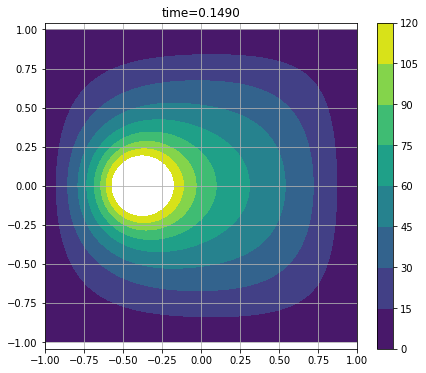

In [3]:
#в неоднородном случае у меня какой-то нереалистичный нагрев
#и дуга почему-то охлаждается и почти не успевает взаимодействовать с источником, может вы знаете как это починить?
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

plt.rcParams["animation.html"] = "jshtml"

x = np.linspace(-1, 1, 100)
y = np.linspace(-1, 1, 100)
t = 0
a = 1
level=[0,15,30,45,60,75,90,105,120]

dt = 0.00001
dx = x[1]-x[0]
dy = y[1]-y[0]

kx = dt*(a**2)/(dx**2)
ky = dt*(a**2)/(dy**2)

X, Y = np.meshgrid(x,y)
#начальное поле
T = np.ones(X.shape)+ np.where(x>0, np.exp(- ((X*X + Y*Y)**0.5 - 0.5)**2/ (2*0.03*0.03) )*1000, 0)

def f(x, y):
    return np.exp(- ((x + 0.4)**2 + y**2)/ (2*0.03*0.03) )*100000

u = T.copy()
un = u.copy()

fig, ax = plt.subplots(1,1,figsize=(7,6))

cont = plt.contourf(X,Y,u,levels=level)
plt.colorbar()
plt.grid()
plt.axis('equal')

def init():
    global cont
    return cont

def steps(i = 1):
    global u
    global un
    global t
    for _ in range (i):
        un[1:-1,1:-1] = u[1:-1,1:-1] + kx* ( u[1:-1,2:] - 2*u[1:-1,1:-1] + u[1:-1,:-2]) + dt*f(X[1:-1,1:-1], Y[1:-1,1:-1]) + ky* ( u[2:,1:-1] - 2*u[1:-1,1:-1] + u[:-2,1:-1])
        un, u = u, un
        t += dt

def update(frame):
    global cont, u
    global t
    for c in cont.collections:
        c.remove()
    cont = plt.contourf(X,Y,u,levels=level)
    ax.set_title('time={:.4f}'.format(t))
    steps(100)
    return cont

anim = animation.FuncAnimation(fig, update, frames=150, init_func=init)

anim

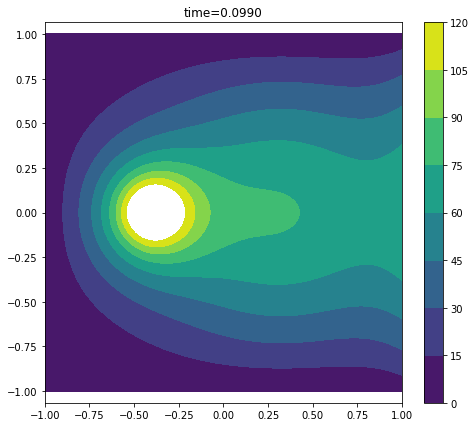

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

plt.rcParams["animation.html"] = "jshtml"

x = np.linspace(-1, 1, 100)
y = np.linspace(-1, 1, 100)
t = 0
a = 1
level=[0,15,30,45,60,75,90,105,120]

dt = 0.0001
dx = x[1]-x[0]
dy = y[1]-y[0]

kx = dt*(a**2)/(dx**2)
ky = dt*(a**2)/(dy**2)

X, Y = np.meshgrid(x,y)
#начальное поле
T = np.ones(X.shape)+ np.where(x>0, np.exp(- ((X*X + Y*Y)**0.5 - 0.5)**2/ (2*0.03*0.03) )*1000, 0)

def f(x, y):
    return np.exp(- ((x + 0.4)**2 + y**2)/ (2*0.03*0.03) )*100000

u = T.copy()
un = u.copy()

fig, ax = plt.subplots(1,1,figsize=(8,7))

cont = plt.contourf(X,Y,u,levels=level)
cb = plt.colorbar()
plt.axis('equal')

def init():
    global cont
    return cont

def steps(i = 1):
    global u
    global un
    global t
    for _ in range (i):
        #un[0,1:-1] = u[1,1:-1] - 50*dy #(низ)
        #un[-1,1:-1] = u[-2,1:-1] + 50*dx #(верх)
        #un[1:-1, 0] = u[1:-1,1] - 50*dy #(лев)
        un[1:-1, -1] = u[1:-1,-2] + 50*dx #правая
        un[1:-1,1:-1] = u[1:-1,1:-1] + kx* ( u[1:-1,2:] - 2*u[1:-1,1:-1] + u[1:-1,:-2]) + dt*f(X[1:-1,1:-1], Y[1:-1,1:-1]) + ky* ( u[2:,1:-1] - 2*u[1:-1,1:-1] + u[:-2,1:-1])
        un, u = u, un
        t += dt

def update(frame):
    global cont, u
    global t
    for c in cont.collections:
        c.remove()
    cont = plt.contourf(X,Y,u,levels=level)
    ax.set_title('time={:.4f}'.format(t))
    steps(10)
    return cont

anim = animation.FuncAnimation(fig, update, frames=100, init_func=init)

anim

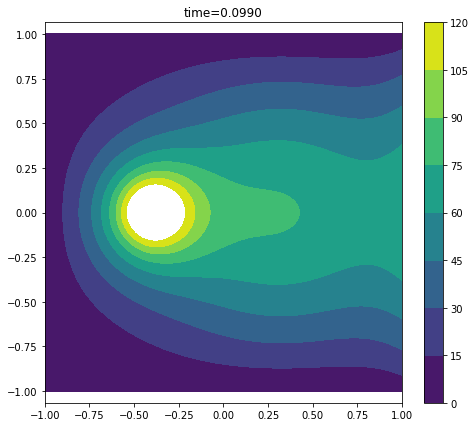

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

plt.rcParams["animation.html"] = "jshtml"

x = np.linspace(-1, 1, 100)
y = np.linspace(-1, 1, 100)
t = 0
a = 1
level=[0,15,30,45,60,75,90,105,120]

dt = 0.0001
dx = x[1]-x[0]
dy = y[1]-y[0]

kx = dt*(a**2)/(dx**2)
ky = dt*(a**2)/(dy**2)

X, Y = np.meshgrid(x,y)
#начальное поле
T = np.ones(X.shape)+ np.where(x>0, np.exp(- ((X*X + Y*Y)**0.5 - 0.5)**2/ (2*0.03*0.03) )*1000, 0)

def f(x, y):
    return np.exp(- ((x + 0.4)**2 + y**2)/ (2*0.03*0.03) )*100000

u = T.copy()
un = u.copy()

fig, ax = plt.subplots(1,1,figsize=(8,7))

cont = plt.contourf(X,Y,u,levels=level)
cb = plt.colorbar()
plt.axis('equal')

def init():
    global cont
    return cont

def steps(i = 1):
    global u
    global un
    global t
    for _ in range (i):
        #un[0,1:-1] = u[1,1:-1] - 50*dy (низ)
        #un[-1,1:-1] = u[-2,1:-1] + 50*dx (верх)
        #un[1:-1, 0] = u[1:-1,1] - 50*dy (лев)
        un[1:-1, -1] = u[1:-1,-2] + 50*dx #правая
        un[1:-1,1:-1] = u[1:-1,1:-1] + kx* ( u[1:-1,2:] - 2*u[1:-1,1:-1] + u[1:-1,:-2]) + dt*f(X[1:-1,1:-1], Y[1:-1,1:-1]) + ky* ( u[2:,1:-1] - 2*u[1:-1,1:-1] + u[:-2,1:-1])
        un, u = u, un
        t += dt

def update(frame):
    global cont, u
    global t
    for c in cont.collections:
        c.remove()
    cont = plt.contourf(X,Y,u,levels=level)
    ax.set_title('time={:.4f}'.format(t))
    steps(10)
    return cont

anim = animation.FuncAnimation(fig, update, frames=100, init_func=init)

anim